In [1]:
!pip install keras
!pip install Keras-Applications
!pip install tensorflow
!pip install opencv-python

In [2]:
import numpy as np
import os
from PIL import Image
from keras.applications.vgg16 import VGG16

# vgg16_model = VGG16(weights="imagenet", include_top=False)

images = []
# Iterate over the images in the folder and add them to the NumPy array
folder_path = 'data/photos'
for image_file in os.listdir(folder_path):
    # Load the image
    images.append(image_file)



2023-09-19 12:39:43.506332: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-09-19 12:39:43.552276: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-09-19 12:39:43.552841: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-19 12:39:44.303297: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [3]:

import tensorflow as tf
import cv2
from keras.layers import Input
from keras.applications.imagenet_utils import preprocess_input

image_input = Input(shape=(224, 224, 3))
# vgg16_model = tf.keras.applications.vgg16.VGG16(input_tensor=image_input,weights="imagenet",include_top=False)
vgg16_model = tf.keras.applications.vgg16.VGG16(input_tensor=image_input,weights="imagenet")

# Change the number of filters in the first convolutional layer
vgg16_model.layers[0].filters = 4

# Compile the model
vgg16_model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

# Train the model
# vgg16_model.fit(x_train, y_train, epochs=10)

# Evaluate the model
# vgg16_model.evaluate(x_test, y_test)

def feature_extraction(img_path) : 
    img_path = folder_path +'/'+ img_path
    # image = Image.open(img_path).resize((224, 224))
    image = cv2.imread(img_path)
    image = cv2.resize(image, (224, 224))
    image = np.array(image)
    image = np.expand_dims(image, axis=0)
    # image = preprocess_input(image)
    image_features = vgg16_model.predict(image)
    return image_features
data = {}
for image in images :
    features = feature_extraction(image)
    data[image] = features
len(data)

1/1 [==============================] - 0s 177ms/step


80

In [4]:
filenames = np.array(list(data.keys()))
feat = np.array(list(data.values()))
nsamples, nx, ny = feat.shape
feat = feat.reshape((nsamples,nx*ny))
feat.shape
from sklearn.decomposition import PCA

pca = PCA(n_components = 0.95)
pca.fit(feat)
x = pca.transform(feat)

In [5]:
filenames = np.array(list(data.keys()))
feat = np.array(list(data.values()))
nsamples, nx, ny = feat.shape
feat = feat.reshape((nsamples,nx*ny))
feat.shape
from sklearn.decomposition import PCA

pca = PCA(n_components = 0.95)
pca.fit(feat)
x = pca.transform(feat)

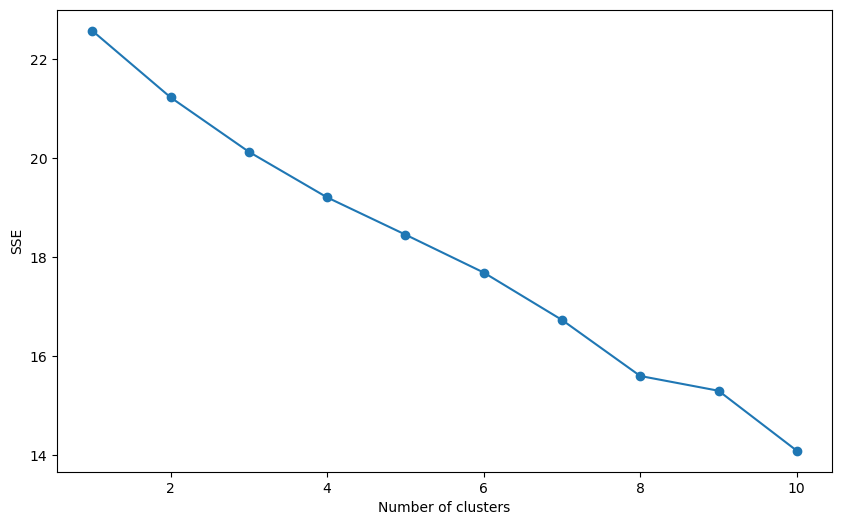

In [6]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# squared error
sse = []
plt.figure(figsize=(10,6))
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(x)
    sse.append(kmeans.inertia_)
plt.plot(range(1, 11), sse, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.show()

In [7]:
from sklearn.metrics import silhouette_score

silhouette_coefficients = []

for i in range(2, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(x)
    score = silhouette_score(x, kmeans.labels_)
    silhouette_coefficients.append(score)

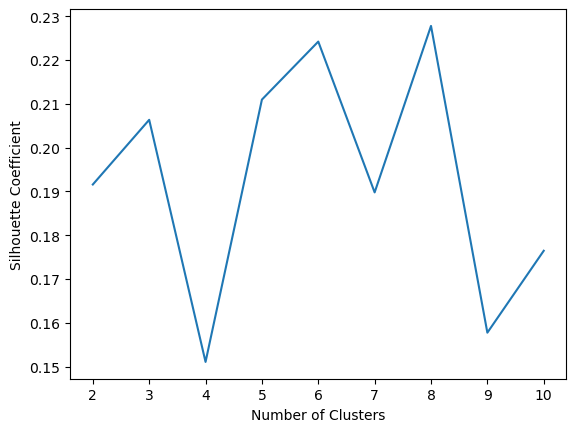

In [8]:
plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [9]:
kmeans = KMeans(n_clusters = 9, init = 'k-means++', max_iter = 600, n_init = 10)
kmeans.fit(x)

KMeans(max_iter=600, n_clusters=9, n_init=10)

In [10]:
groups = {}
for file, cluster in zip(filenames,kmeans.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

kmeans.labels_
groups

{0: ['old-couple-ge9a180ac0_640.jpg',
  'sad-g7e6ada8a4_640.jpg',
  'people-g4cbd1dbc4_640.jpg',
  'sushi-g108a16441_640.jpg',
  'family-g441413fcc_640.jpg',
  'couple-g0b2ee91be_640.jpg',
  'selfie-g626251ddd_640.jpg',
  'terrier-g5cb29fa82_640.jpg',
  'mother-gea63914a7_640.jpg',
  'kid-gfcb80c8d7_640.jpg',
  'cat-g6052b543b_640.jpg',
  'girl-g6a909b6e4_640.jpg',
  'man-g80cf5109d_640.jpg',
  'people-gb066aa303_640.jpg',
  'chicken-soup-g76231cf36_640.jpg',
  'cat-g4fe5d8c20_640.jpg',
  'pizza-gbc9c3ad3c_640.jpg',
  'plate-gc7cadb9f6_640.jpg',
  'children-g13a48a038_640.jpg',
  'woman-g40964425a_640.jpg',
  'cat-g11b1f4535_640.jpg',
  'man-gab0982e39_640.jpg',
  'father-g7328a944c_640.jpg',
  'family-g2ea85c1e0_640.jpg',
  'man-g6d33fb453_640.jpg',
  'cat-gf324dae69_640.jpg',
  'sushi-g47b8ca32e_640.jpg',
  'women-girl-gf81cdab46_640.jpg',
  'girl-gb9f87fafe_640.jpg',
  'puppy-g7bfbbf1d9_640.jpg',
  'mama-gc2e107d95_640.jpg',
  'child-g8f11ee379_640.jpg',
  'champon-g31fa88e14_640.jp

In [11]:
import matplotlib.image as mpimg

os.chdir(folder_path)
def display_images(image_paths):
    # Calculate the number of rows and columns for the subplot grid
    num_images = len(image_paths)
    num_cols = 3
    num_rows = (num_images + num_cols - 1) // num_cols  # Calculate rows based on num_cols

    # Calculate a dynamic figsize based on your desired aspect ratio
    aspect_ratio = 16 / 9  # Adjust this ratio as needed
    fig_width = 12  # Adjust this width as needed
    fig_height = fig_width / aspect_ratio * num_rows / 3  # Adjust 3 for vertical space per row

    # Create the subplot grid with dynamic figsize
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(fig_width, fig_height))

    # Loop through the image filenames and display them in subplots
    for i, filename in enumerate(image_paths):
        row = i // num_cols
        col = i % num_cols
        img = mpimg.imread(filename)
        axs[row, col].imshow(img)
        axs[row, col].axis('off')

    # Hide any empty subplots
    for i in range(num_images, num_rows * num_cols):
        row = i // num_cols
        col = i % num_cols
        axs[row, col].axis('off')

    plt.tight_layout()  # Adjust subplot spacing
    plt.show()

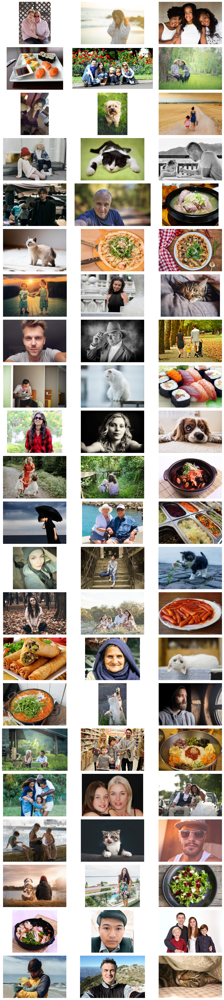

In [12]:
display_images(groups[0])

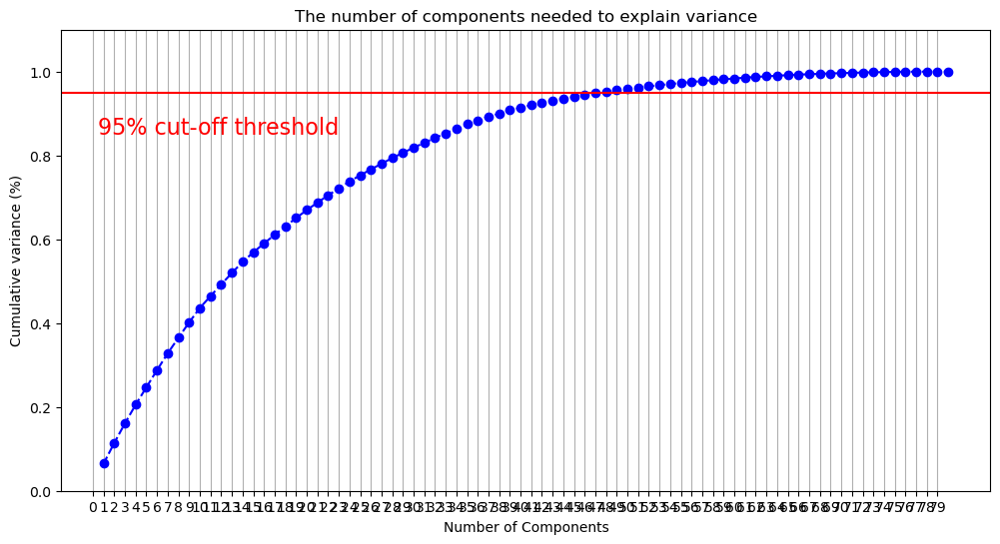

In [13]:
pca = PCA().fit(feat)

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, 81, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, 80, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

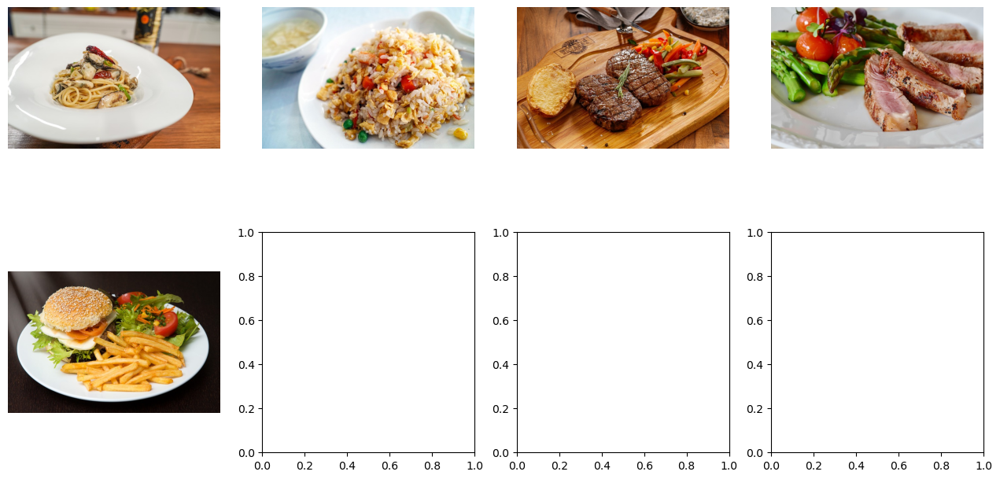

In [14]:
import numpy as np
import matplotlib.image as mpimg

def show_images(images, columns=4):
  """Displays a list of images in a grid.

  Args:
    images: A list of numpy arrays representing images.
    columns: The number of columns to display the images in.
  """

  rows = int(np.ceil(len(images) / columns))
  fig, axs = plt.subplots(rows, columns, figsize=(columns * 4, rows * 4))
  for i, image in enumerate(images):
    # image = folder_path + '/' + image 
    # print(image)
    img = mpimg.imread(image)

    axs[i // columns, i % columns].imshow(img)
    axs[i // columns, i % columns].axis('off')
  plt.show()

# Example usage:
# images = [np.random.randint(0, 255, (100, 100, 3)) for i in range(10)]
show_images(groups[1])


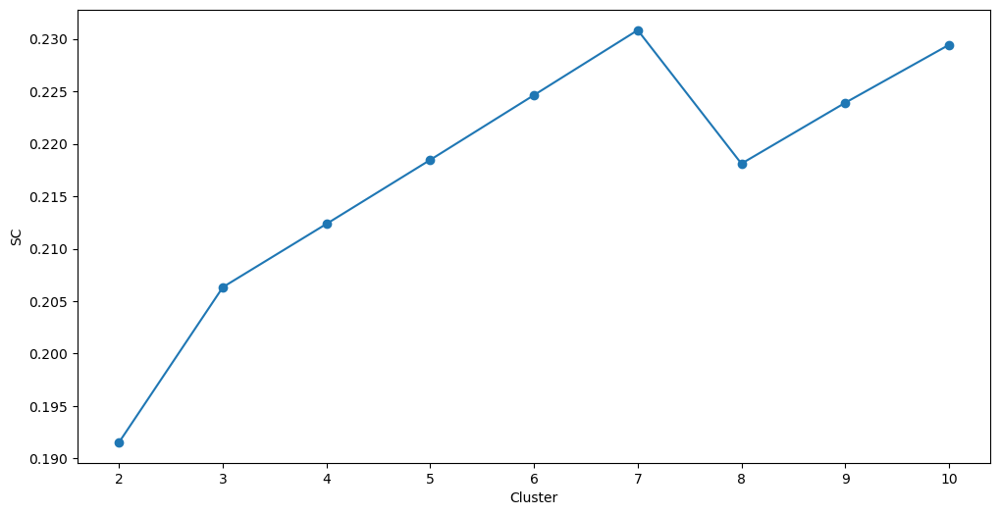

In [15]:
# Aglomerative Cluster
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
import scipy.cluster.hierarchy as sch

sc_average = []

for k in range(2, 11):
    ac = AgglomerativeClustering(n_clusters = k, metric = 'euclidean', linkage = 'ward')
    ac.fit_predict(x)
    score = silhouette_score(x, ac.labels_)
    sc_average.append(score)
plt.plot(range(2, 11), sc_average, marker='o')
plt.xlabel('Cluster')
plt.ylabel("SC")
plt.show()


In [16]:
ac = AgglomerativeClustering(n_clusters = 8, metric = 'euclidean', linkage = 'ward')
clusters = ac.fit_predict(x)

group_h = {}
for file, cluster in zip(filenames, clusters):
    if cluster not in group_h.keys():
        group_h[cluster] = []
        group_h[cluster].append(file)
    else:
        group_h[cluster].append(file)
group_h

{0: ['old-couple-ge9a180ac0_640.jpg',
  'sad-g7e6ada8a4_640.jpg',
  'people-g4cbd1dbc4_640.jpg',
  'sushi-g108a16441_640.jpg',
  'family-g441413fcc_640.jpg',
  'couple-g0b2ee91be_640.jpg',
  'selfie-g626251ddd_640.jpg',
  'terrier-g5cb29fa82_640.jpg',
  'mother-gea63914a7_640.jpg',
  'kid-gfcb80c8d7_640.jpg',
  'cat-g6052b543b_640.jpg',
  'girl-g6a909b6e4_640.jpg',
  'man-g80cf5109d_640.jpg',
  'people-gb066aa303_640.jpg',
  'chicken-soup-g76231cf36_640.jpg',
  'cat-g4fe5d8c20_640.jpg',
  'pizza-gbc9c3ad3c_640.jpg',
  'plate-gc7cadb9f6_640.jpg',
  'children-g13a48a038_640.jpg',
  'woman-g40964425a_640.jpg',
  'cat-g11b1f4535_640.jpg',
  'man-gab0982e39_640.jpg',
  'father-g7328a944c_640.jpg',
  'family-g2ea85c1e0_640.jpg',
  'man-g6d33fb453_640.jpg',
  'cat-gf324dae69_640.jpg',
  'sushi-g47b8ca32e_640.jpg',
  'women-girl-gf81cdab46_640.jpg',
  'girl-gb9f87fafe_640.jpg',
  'puppy-g7bfbbf1d9_640.jpg',
  'mama-gc2e107d95_640.jpg',
  'child-g8f11ee379_640.jpg',
  'champon-g31fa88e14_640.jp

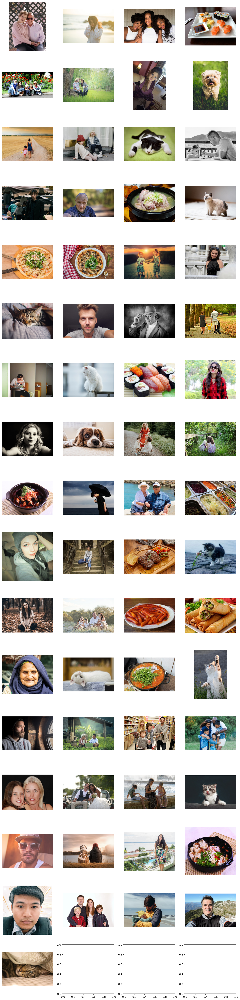

In [17]:
show_images(group_h[0])

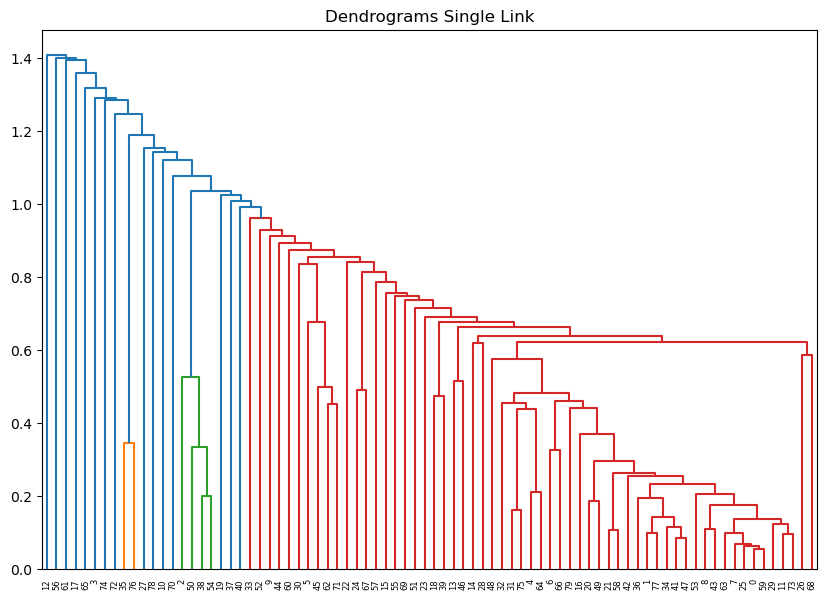

In [18]:
# Dendogram
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(10, 7))  
plt.title("Dendrograms Single Link")  
dend = shc.dendrogram(shc.linkage(x, method='complete'))